# Wstęp

Zadanie nr 14 stanowi rozszerzenie wprowadzenia do zagadnienia głębokich modeli uczenia ze wzmocnieniem (*Deep Reinforcement Learning*, **DRL**), w którym omówione zostaną bardziej zaawansowane modele (w szczególności typu *policy gradient* oraz aktor-krytyk).

## Cel ćwiczenia

Celem ćwiczenia jest zapoznanie z:

* metodami *policy gradient* oraz aktor-krytyk w bibliotece *Stable-Baselines3*
* sposobem przygotowywania środowisk dla tego typu modeli
* dostępnymi hiperparametrami i modyfikacjami metod


## Metody *policy gradient*

W odróżnieniu od omawianych poprzednio metod głębokiego uczenia ze wzmocnieniem opartych na funkcjach wartości (gdzie uczymy się ewaluować akcje w dowolnym stanie), w przypadku *policy gradient* próbujemy bezpośrednio ustalić postać strategii optymalnej $\pi^*$. W tym celu stosujemy postać sparametryzowaną $\pi_\theta$, gdzie $\theta$ jest zbiorem parametrów aktualizowanych podczas uczenia:

$$\pi_\theta(\mathbf{s}, \mathbf{a}) = p(\mathbf{a} | \mathbf{s}, \theta)$$

Celem trenowania modelu strategii odbywać się będzie poprzez aktualizowanie parametrów w taki sposób, aby maksymalizować oczekiwaną wartość zwrotu. Uczenie może odbywać się na różne sposoby - w przypadku metod głębokiego uczenia ze wzmocnieniem, model strategii (sieć neuronową) trenować będziemy metodą gradientową.

Funkcja nagrody (której metody *policy gradient* używają jako funkcji celu) będzie zdefiniowana w następujący sposób:

$$\mathcal{L}(\theta) = \sum_{\mathbf{s}\in\mathbf{S}} d^\pi(\mathbf{s})V^\pi(\mathbf{s}) = \sum_{\mathbf{s}\in\mathbf{S}} d^\pi(\mathbf{s})\sum_{\mathbf{a}\in\mathbf{A}}\pi_\theta(\mathbf{a} | \mathbf{s}) Q^\pi(\mathbf{s}, \mathbf{a}),$$

gdzie $d^\pi(\mathbf{s})=\lim_{t\rightarrow\infty}p(\mathbf{s}_t=\mathbf{s}_0, \pi_\theta)$ jest rozkładem stanów *on-policy* przy strategii $\pi$) - prawdopodobieństwo, że w kroku czasowym $t$ uzyskamy stan $\mathbf{s}$ postępując według strategii $\pi_\theta$, $V^\pi(\mathbf{s})$ to funkcja wartości (oczekiwana wartość zwrotu), a $Q^\pi(\mathbf{s}, \mathbf{a})$ to funkcja jakości.

W literaturze występuje wiele metod uczenia  uczenia *policy gradient*. Jednym z aspektów rozróżniajacych je jest sposób obliczania całkowitej wartości zwrotu (w każdym kroku w środowisku, wykorzystując dotychczasową wartość nagród jako estymację funkcji jakości, lub np. przechodząc cały epizod w środowisku).

### Metody aktor-krytyk

Jedną z metod ustalania wartości funkcji jakości jest podejście **aktor-krytyk**. Wykorzystujemy nim dwa modele: **aktor** (model strategii) jest wykorzystywany do podejmowania akcji w środowisku, oraz **krytyk** (model funkcji jakości), służący do estymacji wartości funkcji jakości $Q$.

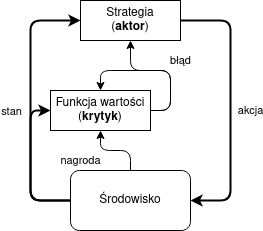

Trenowanie modelu aktor-krytyk polega na uczeniu parametrów $w$ funkcji wartości (krytyka) w celu poprawnego określania wartości zwrotu ($Q$ lub $V$) oraz trenowaniu modelu strategii $\pi_\theta(\mathbf{s}, \mathbf{a})$ (aktora) na podstawie sprzężenia zwrotnego dostarczanego przez krytyka, obserwującego i oceniającego podejmowane akcje. Algorytm dzałania wygląda następująco:

1. Zainicjalizuj stan początkowy $\mathbf{s}_1$, parametry aktora $\theta$ i krytyka $w$
2. Próbkuj akcję $\mathbf{a}_1 \sim \pi_\theta(\mathbf{a} | \mathbf{s})$
3. W każdym kroku czasowym $t = 1, 2, \dots, T$:
  1. Pobierz wartość nagrody $r_t$ i następny stan $\mathbf{s}_{t+1}$
  2. Próbkuj akcję w następnym kroku $\mathbf{a}_{t+1} \sim \pi_\theta(\mathbf{a}_{t+1} | \mathbf{s}_{t+1})$
  3. Zaktualizuj parametry strategii $\theta$ wg gradientu funkcji celu
  4. Zaktualizuj parametry funkcji wartości na podstawie błędu pomiędzy wartością funkcji $Q$ w kolejnym kroku, a sumą funkcji $Q$ z aktualnego oraz uzyskanej nagrody.

Najczęściej używa się dwóch współczynników uczenia: osobno dla trenowania aktora $\alpha_\theta$ oraz krytyka $\alpha_w$.


### A3C/A2C

Algorytmy A3C (*Asynchronous Advantage Actor-Critic*) i A2C (*Advantage Actor-Critic*) [[Mnih et al.](https://arxiv.org/abs/1602.01783)] to dwie wersje metody głębokiego uczenia ze wzmocnieniem oparte na architekturze aktor-krytyk. Metoda ta opiera się na wykorzystaniu wspólnej sieci neuronowej do predykcji akcji (model strategii) oraz ich ewaluacji (model funkcji wartości), przy użyciu odrębnych wyjść (*heads*). Podejście to bazuje na wykorzystaniu wielu agentów, oddziałujących z własną kopią środowiska przy użyciu indywidualnych zestawów wag sieci i uczących swoje kopie przez określony okres, a następnie synchronizujące się z globalną siecią asynchronicznie (A3C) lub synchronicznie (A2C).

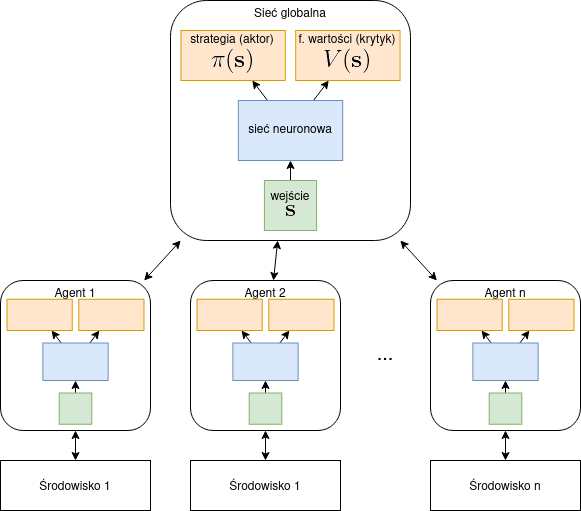

Dzięki zastosowaniu wielu agentów oddziałujących ze swoimi kopiami środowiska, oraz cyklicznemu synchronizowaniu wag z siecią globalną, trenowanie modelu może odbywać się na bardziej zróżnicowanym zbiorze doświadczeń, niż w przypadku pojedynczego agenta, a przez to model powinien zbiegać szybciej, do globalnego optimum bez wykorzystania *experience replay*.

Drugim z ulepszeń zastosowanych w tych metodach jest zastąpienie funkcji jakości $Q$ przez funkcję przewagi $A$. W tym podejściu, model krytyka, zamiast uczyć się wprost wartości funkcji jakości, próbujemy nauczyć się funkcji, która jest różnicą funkcji jakości i funkcji jakości:

$$A(\mathbf{s}, \mathbf{a}) = Q(\mathbf{s}, \mathbf{a}) - V(\mathbf{s})$$

Innymi słowy, chcemy obliczać, o ile lepszy/gorszy będzie wybór akcji $\mathbf{a}$ w stanie $\mathbf{s}$ i postępowanie dalej zgodnie ze strategią od postępowania zgodnie ze strategią bezpośrednio od stanu $\mathbf{s}$.


Podobnie jak poprzednio, skorzystamy z gotowej implementacji metody A3C/A2C z biblioteki [**Stable-Baselines3**](https://stable-baselines.readthedocs.io). Zaczniemy od powtórzenia eksperymentów w środowisku CartPole z poprzedniej listy.


In [ ]:
# !apt-get install -y xvfb python-opengl > /dev/null 2>&1
# !pip install gym pyvirtualdisplay stable-baselines3[extra] > /dev/null 2>&1


In [ ]:
import os
import random

import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import animation
from stable_baselines3 import A2C
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.results_plotter import plot_results, load_results
from stable_baselines3.a2c.policies import MlpPolicy

from IPython import display as ipythondisplay

SEED = 13
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

def visualize_model(model, max_steps=50, env=None):
    env = env or model.get_env()

    reset_result = env.reset()
    obs = reset_result[0] if isinstance(reset_result, tuple) else reset_result

    fig, ax = plt.subplots()
    frames = []
    done = False

    while not done:
        frames.append(env.render())

        with torch.no_grad():
            action, _ = model.predict(obs)

        step_result = env.step(action)

        if len(step_result) == 5:
            obs, reward, terminated, truncated, info = step_result
            done = terminated or truncated
        else:
            obs, reward, done, info = step_result

        if len(frames) >= max_steps:
            break

    anim = animation.FuncAnimation(
        fig=fig,
        func=lambda i: ax.imshow(frames[i]),
        frames=range(len(frames)),
        interval=100,
        blit=False,
    )
    plt.close()

    reward_avg, reward_std = evaluate_policy(model, env, n_eval_episodes=100)
    print(f"Reward in episode: {reward_avg:.2f} +/- {reward_std:.2f}")

    return anim.to_jshtml()

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


Sprawdźmy, jakie parametry przyjmuje model A2C oraz jego model strategii (zwróćmy uwagę, że stosujemy strategie odpowiednie dla A2C!).

Zwróćmy uwagę, że implementacja A2C w stable-baselines3 przyjmuje jeden współczynnik uczenia `learnin_rate` (stosowany dla modelu strategii) - współczynnik dla funkcji wartości uzyskiwany jest przez przemnożenie przez parametr `vf_coef`. Z kolei interfejs `MlpPolicy` jest podobny do klasy przeznaczonej dla modelu DQN - szczególnie interesująca jest architektura sieci.


In [ ]:
help(A2C)


Help on class A2C in module stable_baselines3.a2c.a2c:

class A2C(stable_baselines3.common.on_policy_algorithm.OnPolicyAlgorithm)
 |  A2C(policy: str | type[stable_baselines3.common.policies.ActorCriticPolicy], env: Union[gymnasium.core.Env, ForwardRef('VecEnv'), str], learning_rate: float | collections.abc.Callable[[float], float] = 0.0007, n_steps: int = 5, gamma: float = 0.99, gae_lambda: float = 1.0, ent_coef: float = 0.0, vf_coef: float = 0.5, max_grad_norm: float = 0.5, rms_prop_eps: float = 1e-05, use_rms_prop: bool = True, use_sde: bool = False, sde_sample_freq: int = -1, rollout_buffer_class: type[stable_baselines3.common.buffers.RolloutBuffer] | None = None, rollout_buffer_kwargs: dict[str, typing.Any] | None = None, normalize_advantage: bool = False, stats_window_size: int = 100, tensorboard_log: str | None = None, policy_kwargs: dict[str, typing.Any] | None = None, verbose: int = 0, seed: int | None = None, device: torch.device | str = 'auto', _init_setup_model: bool = True

In [ ]:
help(MlpPolicy)


Help on class ActorCriticPolicy in module stable_baselines3.common.policies:

class ActorCriticPolicy(BasePolicy)
 |  ActorCriticPolicy(observation_space: gymnasium.spaces.space.Space, action_space: gymnasium.spaces.space.Space, lr_schedule: collections.abc.Callable[[float], float], net_arch: list[int] | dict[str, list[int]] | None = None, activation_fn: type[torch.nn.modules.module.Module] = <class 'torch.nn.modules.activation.Tanh'>, ortho_init: bool = True, use_sde: bool = False, log_std_init: float = 0.0, full_std: bool = True, use_expln: bool = False, squash_output: bool = False, features_extractor_class: type[stable_baselines3.common.torch_layers.BaseFeaturesExtractor] = <class 'stable_baselines3.common.torch_layers.FlattenExtractor'>, features_extractor_kwargs: dict[str, typing.Any] | None = None, share_features_extractor: bool = True, normalize_images: bool = True, optimizer_class: type[torch.optim.optimizer.Optimizer] = <class 'torch.optim.adam.Adam'>, optimizer_kwargs: dict[s

Zacznijmy od przetestowania niewytrenowanego modelu w środowisku.


In [ ]:
eval_env_untrained = gym.make("CartPole-v1", render_mode="rgb_array")
model = A2C(MlpPolicy, eval_env_untrained)
display(ipythondisplay.HTML(visualize_model(model, env=eval_env_untrained)))

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 57.26 +/- 55.69


Nietrenowany model A2C osiągnął w środowisku CartPole średnią nagrodę na poziomie 57.26 punktów, co jest typowym rezultatem dla działań losowych. Gigantyczne odchylenie standardowe (+/- 55.69) jednoznacznie pokazuje, że wynik ten jest dziełem czystego przypadku, w którym agent poruszał się po omacku. Aby model zaczął działać stabilnie i osiągał maksymalne wyniki, konieczne jest przeprowadzenie właściwego procesu uczenia.

Analogicznie do zadania 13, spróbujemy wytrenować najprostszy model A2C w celu porównania procesu trenowania i efektów z modelem DQN.

Using cuda device
Wrapping the env in a DummyVecEnv.


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


------------------------------------
| rollout/              |          |
|    ep_len_mean        | 21.4     |
|    ep_rew_mean        | 21.4     |
| time/                 |          |
|    fps                | 248      |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -0.693   |
|    explained_variance | 0.0135   |
|    learning_rate      | 0.0001   |
|    n_updates          | 99       |
|    policy_loss        | 1.98     |
|    value_loss         | 10.3     |
------------------------------------
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 23.7     |
|    ep_rew_mean        | 23.7     |
| time/                 |          |
|    fps                | 259      |
|    iterations         | 200      |
|    time_elapsed       | 3        |
|    total_timesteps    | 1000     |
| train/                |          |
|

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 220.54 +/- 93.16


Max reward: 500.0


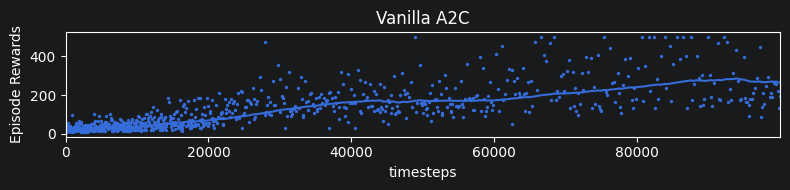

In [ ]:
batch_size = 64
lr = 1e-4
total_timesteps = 100000

env = gym.make("CartPole-v1")
log_dir = "/tmp/vanilla/"
os.makedirs(log_dir, exist_ok=True)
env = Monitor(env, filename=log_dir)

vanilla_a2c = A2C(
    MlpPolicy, env, learning_rate=lr, seed=SEED,
    verbose=1,
)
vanilla_a2c.learn(total_timesteps)

eval_env = gym.make("CartPole-v1", render_mode="rgb_array")

display(ipythondisplay.HTML(visualize_model(vanilla_a2c, env=eval_env)))
plot_results([log_dir], total_timesteps, "timesteps", "Vanilla A2C")
results = load_results(log_dir)
print(f"Max reward: {results.r.max()}")

- Trening zakończył się sukcesem, a model Vanilla A2C wykazał wyraźny postęp, zwiększając średni wynik z około 57 do 220.54 punktów. Drastyczny spadek wartości `value_loss` pod koniec uczenia dowodzi, że Krytyk nauczył się niemal bezbłędnie oceniać sytuację na planszy. Pomimo udanej nauki, wysokie odchylenie standardowe ($\pm 93.16$) sygnalizuje, że agentowi wciąż brakuje pełnej stabilności i zdarzają się mu przedwczesne porażki przed osiągnięciem maksymalnego limitu 500 punktów.
- Przynajmniej raz w trakcie 100 000 kroków treningu agent osiągnął perfekcję – utrzymał balans przez maksymalny dopuszczalny czas (500 kroków). Model udowodnił więc, że fizycznie rozumie jak wygrać tę grę.
- Linia trendu idzie w górę, co oznacza, że proces uczenia jest zdrowy i zbieżny. Duży rozrzut punktów pod sam koniec (jednoczesne występowanie wyników 500 i 50) tłumaczy uzyskane wcześniej odchylenie standardowe $\pm 93.16$. Agent jest już mądry, ale jego polityka nadal ma charakter probabilistyczny (losowy). 

Wyniki są lepsze niż najprostszy DQN, lecz uczenie trwa stosunkowo długo. Moglibyśmy zająć się teraz strojeniem hiperparametrów, ale zanim to zrobimy, to spróbujmy wykorzystać fakt, że A2C może być stosowany do uczenia modelu przy użyciu wielu agentów na raz. W tym celu będziemy musieli zwektoryzować nasze środowisko - posłuży do tego wbudowana w bibliotekę stable-baselines3 funkcja `make_vec_env`. Sprawdźmy jej parametry.



In [ ]:
help(make_vec_env)


Help on function make_vec_env in module stable_baselines3.common.env_util:

make_vec_env(env_id: str | collections.abc.Callable[..., gymnasium.core.Env], n_envs: int = 1, seed: int | None = None, start_index: int = 0, monitor_dir: str | None = None, wrapper_class: collections.abc.Callable[[gymnasium.core.Env], gymnasium.core.Env] | None = None, env_kwargs: dict[str, typing.Any] | None = None, vec_env_cls: type[stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv | stable_baselines3.common.vec_env.subproc_vec_env.SubprocVecEnv] | None = None, vec_env_kwargs: dict[str, typing.Any] | None = None, monitor_kwargs: dict[str, typing.Any] | None = None, wrapper_kwargs: dict[str, typing.Any] | None = None) -> stable_baselines3.common.vec_env.base_vec_env.VecEnv
    Create a wrapped, monitored ``VecEnv``.
    By default it uses a ``DummyVecEnv`` which is usually faster
    than a ``SubprocVecEnv``.

    :param env_id: either the env ID, the env class or a callable returning an env
    :par

Interesującym dla nas parametrem jest liczba środowisk, które będą wykorzystane w trenowaniu modelu. Ponadto, możemy już tutaj przekazać folder do zapisu historii uczenia `monitor_dir`. Spróbujmy stworzyć 4 środowiska i wytrenować model A2C z użyciem 4 agentów. W stable-baselines3 będze to równie proste, jak dla modelu DQN.

Uwaga: oprócz zwektoryzowanych środowisk tworzymy również osobne środowisko ewaluacyjne, które posłuży nam do sprawdzenia wytrenowanego modelu.


Using cuda device


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


------------------------------------
| rollout/              |          |
|    ep_len_mean        | 21.4     |
|    ep_rew_mean        | 21.4     |
| time/                 |          |
|    fps                | 956      |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 2000     |
| train/                |          |
|    entropy_loss       | -0.693   |
|    explained_variance | 0.0761   |
|    learning_rate      | 0.0001   |
|    n_updates          | 99       |
|    policy_loss        | 2        |
|    value_loss         | 10.4     |
------------------------------------
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 24.2     |
|    ep_rew_mean        | 24.2     |
| time/                 |          |
|    fps                | 962      |
|    iterations         | 200      |
|    time_elapsed       | 4        |
|    total_timesteps    | 4000     |
| train/                |          |
|

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 473.36 +/- 58.30


Max reward: 500.0


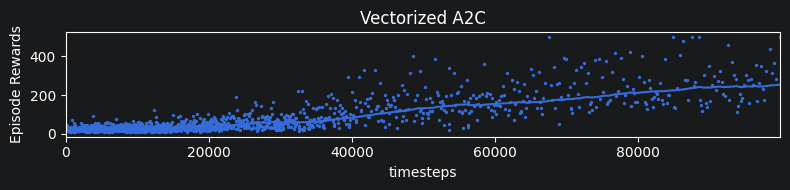

In [ ]:
log_dir = "/tmp/vectorized/"
os.makedirs(log_dir, exist_ok=True)

eval_env = gym.make("CartPole-v1", render_mode="rgb_array")
vec_env = make_vec_env("CartPole-v1", n_envs=4, monitor_dir=log_dir)

batch_size = 64
lr = 1e-4
total_timesteps = 100000

vectorized_a2c = A2C(
    MlpPolicy, vec_env, learning_rate=lr, seed=SEED,
    verbose=1,
)
vectorized_a2c.learn(total_timesteps)
display(ipythondisplay.HTML(visualize_model(vectorized_a2c, env=eval_env)))
plot_results([log_dir], total_timesteps, "timesteps", "Vectorized A2C")
results = load_results(log_dir)
print(f"Max reward: {results.r.max()}")


* Zastosowanie zwektoryzowanych środowisk pozwoliło na zbieranie zróżnicowanych, nieskorelowanych ze sobą doświadczeń od czterech niezależnych agentów w tym samym czasie. Dzięki temu sieć uniknęła problemu przeuczania się na konkretnych sekwencjach błędów, co zaowocowało skokiem średniej nagrody z 220 do ponad 473 punktów i niemal całkowitym "rozwiązaniem" środowiska w tej samej liczbie kroków uczenia.

## Zadanie 1.

Zbadaj wpływ kilku (liczba środowisk oraz co najmniej 3 inne) wybranych hiperparametrów na trenowanie i działanie modelu A2C (uwaga: oprócz zbadania należy rozumieć, do czego służy dany hiperparametr). Zapisz swoje wnioski i przygotuj wizualizacje uzyskiwanych rezultatów oraz animiacje działania modelu.



Uruchamiam: 1. Baza (n_envs=4, lr=7e-4, gamma=0.99)


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[1. Baza (n_envs=4, lr=7e-4, gamma=0.99)] Średnia nagroda po 50000 krokach: 412.05 +/- 120.73


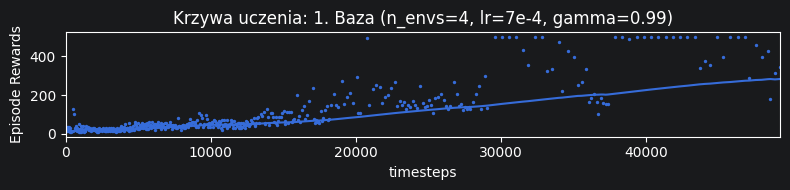

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 433.82 +/- 91.00



Uruchamiam: 2. Jedno srodowisko (n_envs=1)


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[2. Jedno srodowisko (n_envs=1)] Średnia nagroda po 50000 krokach: 65.25 +/- 11.74


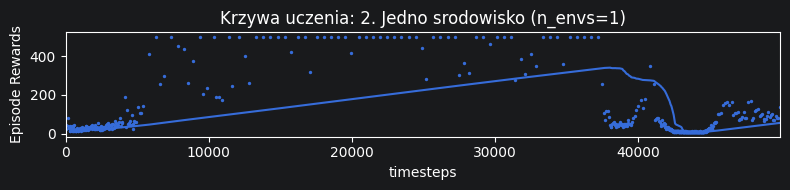

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 65.60 +/- 12.69



Uruchamiam: 3. Szybkie uczenie (lr=5e-3)


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[3. Szybkie uczenie (lr=5e-3)] Średnia nagroda po 50000 krokach: 500.00 +/- 0.00


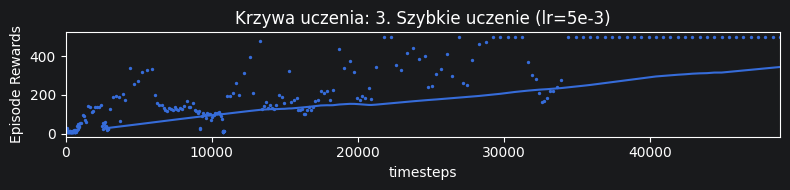

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 500.00 +/- 0.00



Uruchamiam: 4. Krotkowzrocznosc (gamma=0.8)


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[4. Krotkowzrocznosc (gamma=0.8)] Średnia nagroda po 50000 krokach: 458.95 +/- 41.16


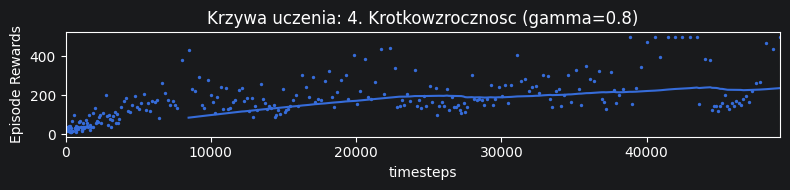

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 433.84 +/- 58.50



Uruchamiam: 5. Duza eksploracja (ent_coef=0.1)


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[5. Duza eksploracja (ent_coef=0.1)] Średnia nagroda po 50000 krokach: 306.05 +/- 74.60


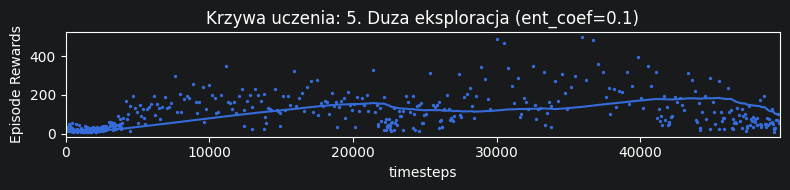

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: 303.88 +/- 67.86


In [9]:
def run_a2c_experiment(experiment_name, n_envs, learning_rate, gamma, ent_coef, total_timesteps=50000):
    print(f"\nUruchamiam: {experiment_name}")

    log_dir = f"/tmp/a2c_experiments/{experiment_name.replace(' ', '_')}/"
    os.makedirs(log_dir, exist_ok=True)

    vec_env = make_vec_env("CartPole-v1", n_envs=n_envs, monitor_dir=log_dir)
    eval_env = gym.make("CartPole-v1", render_mode="rgb_array")

    model = A2C(
        "MlpPolicy",
        vec_env,
        learning_rate=learning_rate,
        gamma=gamma,
        ent_coef=ent_coef,
        seed=13,
        verbose=0
    )

    model.learn(total_timesteps=total_timesteps)

    reward_avg, reward_std = evaluate_policy(model, eval_env, n_eval_episodes=20)
    print(f"[{experiment_name}] Średnia nagroda po {total_timesteps} krokach: {reward_avg:.2f} +/- {reward_std:.2f}")

    plot_results([log_dir], total_timesteps, "timesteps", f"Krzywa uczenia: {experiment_name}")
    plt.show()

    html_anim = visualize_model(model, env=eval_env)
    display(ipythondisplay.HTML(html_anim))

    return model

experiments_config = {
    "1. Baza (n_envs=4, lr=7e-4, gamma=0.99)": (4, 7e-4, 0.99, 0.0),
    "2. Jedno srodowisko (n_envs=1)":          (1, 7e-4, 0.99, 0.0),
    "3. Szybkie uczenie (lr=5e-3)":            (4, 5e-3, 0.99, 0.0),
    "4. Krotkowzrocznosc (gamma=0.8)":         (4, 7e-4, 0.80, 0.0),
    "5. Duza eksploracja (ent_coef=0.1)":      (4, 7e-4, 0.99, 0.1),
}

trained_models = {}
for name, params in experiments_config.items():
    n_envs, lr, gamma, ent_coef = params
    trained_models[name] = run_a2c_experiment(
        experiment_name=name,
        n_envs=n_envs,
        learning_rate=lr,
        gamma=gamma,
        ent_coef=ent_coef,
        total_timesteps=50000
    )

- Base - Wykres pokazuje klasyczny, zdrowy proces uczenia. Linia trendu systematycznie pnie się w górę. Zastosowanie 4 środowisk zapewnia odpowiednią stabilność, a domyślne parametry pozwalają agentowi dobrze opanować zasady gry. Model nie jest jeszcze perfekcyjny (nie osiąga stałych 500 punktów po 50k kroków), ale zmierza w bardzo dobrym kierunku.
- Jedno środowisko - Początkowo model uczył się całkiem nieźle, zbliżając się do 300 punktów, po czym w okolicach 40 000 kroku nastąpiło nagłe załamanie (wykres drastycznie spada niemal do zera). W sieciach neuronowych nazywamy to katastroficznym zapominaniem. Agent opierając się na danych tylko z jednej gry, trafił na specyficzną sekwencję stanów, która kompletnie zdestabilizowała gradienty i nadpisała jego dobrą wiedzę błędnymi wagami. To ostateczny dowód na to, dlaczego A2C potrzebuje wektoryzacji (n_envs > 1).
- Szybkie uczenie - CartPole to stosunkowo prosta gra. Domyślny współczynnik uczenia (7e-4) był dla niej zbyt ostrożny. Podniesienie parametru Learning Rate sprawiło, że sieć robiła znacznie większe kroki w kierunku optymalnej strategii. Wykres wystrzelił w górę i po zaledwie 35 000 krokach agent "zablokował się" na maksymalnym wyniku 500, nie popełniając już żadnych błędów.
- Krótkowzroczność - Parametr Gamma (od 0 do 1) określa, jak daleko w przyszłość patrzy agent. Gamma=0.99 oznacza planowanie długoterminowe. Zmniejszenie do 0.8 sprawiło, że agent stał się "krótkowzroczny" – dbał tylko o to, aby tyczka nie spadła w ciągu kilku najbliższych klatek, ignorując długofalowe konsekwencje swoich ruchów. W grze CartPole nagroda jest przyznawana w każdym kroku, więc model wciąż radził sobie nieźle, ale wykres jest wyraźnie bardziej "poszarpany" i spłaszczony w porównaniu z bazą. W bardziej skomplikowanych grach (np. szachy), taka krótkowzroczność zniszczyłaby proces uczenia.
- Duża eksploracja - Entropia to matematyczna miara chaosu/niepewności. W RL dodajemy ją do funkcji celu, aby zmusić agenta do eksploracji i zapobiec zbyt szybkiemu uwierzeniu, że "ta jedna konkretna akcja jest zawsze najlepsza". Wartość 0.1 jest jednak gigantyczna. Wykres wznosi się do ok. 200-300 punktów i staje w miejscu, mocno oscylując. Dlaczego? Bo nawet jeśli agent wie, że musi pojechać wózkiem w lewo, wysoka entropia zmusza go do okazjonalnego, losowego ruchu w prawo. Agent w naturalny sposób "sabotuje" własną grę, próbując wymuszonych eksperymentów.

## Zadanie 2.

Jedną z zalet metod *policy gradient* oraz aktor-krytyk jest fakt, że dzięki zastosowaniu modelu strategii możliwe jest działanie modelu w środowiskach z ciągłą przestrzenią akcji. Wybierz dowolne środowisko z ciągłą przestrzenią akcji spośród dostępnych w bibliotece [Gym](https://gym.openai.com/envs) i zastosuj na nim model A2C. Dostrój hiperparametry modelu tak, aby uzyskać poprawne działanie. Zapoznaj się z definicją funkcji nagrody w środowisku.

W przypadku wyboru środowiska z obserwacjami wizualnymi zmodyfikuj wykorzystany model strategii. (Uwaga: proszę mieć na uwadze, że trenowanie modeli A2C dla środowisk o ciągłej przestrzeni akcji jest bardziej złożone obliczeniowo - próba wytrenowania modelu dla bardzo złożonego środowiska może zająć dłużej).


Using cuda device


C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


-------------------------------------
| rollout/              |           |
|    ep_len_mean        | 200       |
|    ep_rew_mean        | -1.32e+03 |
| time/                 |           |
|    fps                | 687       |
|    iterations         | 100       |
|    time_elapsed       | 2         |
|    total_timesteps    | 2000      |
| train/                |           |
|    entropy_loss       | -2.5      |
|    explained_variance | 0.00752   |
|    learning_rate      | 0.001     |
|    n_updates          | 99        |
|    policy_loss        | -55.1     |
|    std                | 0.986     |
|    value_loss         | 614       |
-------------------------------------
-------------------------------------
| rollout/              |           |
|    ep_len_mean        | 200       |
|    ep_rew_mean        | -1.41e+03 |
| time/                 |           |
|    fps                | 708       |
|    iterations         | 200       |
|    time_elapsed       | 5         |
|    total_t

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Średnia nagroda w epizodzie: -736.27 +/- 674.42


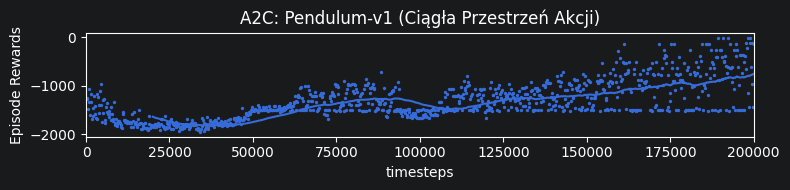

C:\Users\48572\.conda\envs\deep_learning\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward in episode: -729.30 +/- 631.89


In [10]:
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

env_id = "Pendulum-v1"
log_dir = "/tmp/a2c_pendulum/"
os.makedirs(log_dir, exist_ok=True)

vec_env = make_vec_env(env_id, n_envs=4, monitor_dir=log_dir)
eval_env = gym.make(env_id, render_mode="rgb_array")

model_a2c_continuous = A2C(
    "MlpPolicy",
    vec_env,
    learning_rate=0.001,
    gamma=0.95,
    ent_coef=0.0,
    use_sde=True,
    seed=SEED,
    verbose=1
)

total_timesteps = 200000
model_a2c_continuous.learn(total_timesteps=total_timesteps)

reward_avg, reward_std = evaluate_policy(model_a2c_continuous, eval_env, n_eval_episodes=20)
print(f"Średnia nagroda w epizodzie: {reward_avg:.2f} +/- {reward_std:.2f}")

plot_results([log_dir], total_timesteps, "timesteps", "A2C: Pendulum-v1 (Ciągła Przestrzeń Akcji)")
plt.show()

html_anim = visualize_model(model_a2c_continuous, env=eval_env, max_steps=200)
display(ipythondisplay.HTML(html_anim))

* Algorytm A2C udowodnił, że potrafi z powodzeniem sterować wartościami ciągłymi (siłą silnika). Zamiast wybierać konkretne akcje, sieć skutecznie uczyła się dopasowywać rozkład prawdopodobieństwa, co potwierdza systematyczny spadek parametru `std` (odchylenia standardowego) w logach – agent stawał się coraz bardziej precyzyjny w dozowaniu siły.
* Model poprawnie zinterpretował rygorystyczne środowisko, w którym celem jest wyłącznie minimalizacja kar (ujemnych punktów) w stałym czasie 200 kroków. Po początkowym okresie chaotycznej eksploracji, średnia wyników zaczęła wyraźnie piąć się w górę, w stronę zera.
* Ogromny rozrzut końcowych wyników (widoczne rozdwojenie chmury punktów na wykresie i wysokie odchylenie standardowe $\pm 674.42$) pokazuje wrażliwość modelu na stan początkowy. Agent doskonale radzi sobie z utrzymaniem wahadła, gdy ma łatwiejszy start, ale wciąż ma trudności z wykonaniem skomplikowanego manewru "rozbujania" z najgorszej pozycji (idealnie w dół), co wskazuje, że A2C może potrzebować dłuższego treningu.